In [5]:
import pandas as pd
df = pd.read_csv('/Users/mana/projects/Lambda/Unit2_Sprint3/clean_data.csv')
df.head()

,Unnamed: 0,VISA_CLASS,CASE_STATUS,SOC_TITLE,SOC_CODE,NAICS_CODE,EMPLOYER_NAME,AGENT_ATTORNEY_LAW_FIRM,WORKSITE_ADDRESS_CLEAN,WORKSITE_CITY_CLEAN,WORKSITE_STATE,WORKSITE_POSTAL_CODE,WAGE_RATE_ANNUAL,PREVAILING_WAGE_RATE_ANNUAL,PW_WAGE_LEVEL,PW_OES_YEAR,GPS
0,24,H-1B,CERTIFIED,ADVERTISING AND PROMOTIONS MANAGER,11-2011,511210.0,Fantuan,Nancyvizer,NaN,Chicago,IL,60604.0,68640.0,15080.0,NaN,NaN,NaN
1,26,H-1B,CERTIFIED,ADVERTISING AND PROMOTIONS MANAGER,11-2011,56142.0,Tpusa Fhcs,Elaineyoung,NaN,Dallas,TX,75220.0,99000.0,15080.0,NaN,NaN,NaN
2,47,H-1B,CERTIFIED,ADVERTISING AND PROMOTIONS MANAGER,11-2011,611310.0,University Of Texas At Dallas,Nan,800 West Campbell Road,Richardson,TX,75080.0,67500.0,55370.0,Level I,2018.0,"(32.9782965, -96.7484148)"
3,52,H-1B,CERTIFIED,ADVERTISING AND PROMOTIONS MANAGER,11-2011,541830.0,Zenith Media Services,The Navarre Law Firm,299 W Houston Street,New York,NY,10014.0,102000.0,94806.0,Level I,2018.0,NaN
4,54,H-1B,CERTIFIED,ADVERTISING AND PROMOTIONS MANAGER,11-2011,334111.0,Apple,"Fragomen, Del Rey, Bernsen And Loewy",1 Apple Park Way,Cupertino,CA,95014.0,97781.0,97781.0,Level II,2018.0,"(37.3337572, -122.0113815)"


In [6]:
# CLEAN DATA
# Get names of indexes for which column SOC_CODE has non-number value
indexNames = df[ df['SOC_CODE'] == 'OPERATIONS RESEARCH ANALYSTS' ].index
# Delete these row indexes from dataFrame
df.drop(indexNames , inplace=True)

In [7]:
import numpy as np
df = df[(df['WAGE_RATE_ANNUAL'] >= np.percentile(df['WAGE_RATE_ANNUAL'], 80)) & 
        (df['WAGE_RATE_ANNUAL'] <= np.percentile(df['WAGE_RATE_ANNUAL'], 99.9))]

In [8]:
from sklearn.model_selection import train_test_split
train = df
train_val, test = train_test_split(train, train_size=0.80, test_size=0.20, random_state=42)
train, val = train_test_split(train_val, train_size=0.80, test_size=0.20, random_state=42)
train.shape, val.shape, test.shape

((73697, 17), (18425, 17), (23031, 17))

In [9]:
train['WAGE_RATE_ANNUAL'].describe()

count     73697.000000
mean     107702.945692
std       45862.461706
min       57540.000000
25%       75000.000000
50%       94900.000000
75%      125590.400000
max      367000.000000
Name: WAGE_RATE_ANNUAL, dtype: float64

In [10]:
train_val.shape, val.shape, test.shape

((92122, 17), (18425, 17), (23031, 17))

In [11]:
def wrangle(X):
    """Wrangle train, validate, and test sets in the same way"""
    
    # Prevent SettingWithCopyWarning
    X = X.copy()
    
    # create a "missing indicator" column, because the fact that
    # values are missing may be a predictive signal.
    cols_with_null = ['SOC_TITLE', 'WORKSITE_STATE', 'GPS']
    for col in cols_with_null:
        X[col+'_MISSING'] = X[col].isnull()
            
    # Drop duplicate columns
    duplicates = []
    X = X.drop(columns=duplicates)
    
    # Drop 
    unusable_variance = ['VISA_CLASS', 'CASE_STATUS', 'Unnamed: 0', 'WORKSITE_POSTAL_CODE', 'WORKSITE_ADDRESS_CLEAN', 'PW_OES_YEAR']
    X = X.drop(columns=unusable_variance)
    
    # deal with outliers
    
    # converting 'PW_OES_YEAR' from float to int 
    X['SOC_TITLE'] = X['SOC_TITLE'].astype(str)
    X['SOC_CODE'] = X['SOC_CODE'].str.replace('-', '')
    X['SOC_CODE'] = X['SOC_CODE'].astype(int)
    X['EMPLOYER_NAME'] = X['EMPLOYER_NAME'].astype(str)
    X['AGENT_ATTORNEY_LAW_FIRM'] = X['AGENT_ATTORNEY_LAW_FIRM'].astype(str)
    X['WORKSITE_CITY_CLEAN'] = X['WORKSITE_CITY_CLEAN'].astype(str)
    X['WORKSITE_STATE'] = X['WORKSITE_STATE'].astype(str)
    X['GPS'] = X['GPS'].astype(str)

    # Convert PW_WAGE_LEVEL from string to numbers
    # sub_wage_levels = {'Level I': 1, 'Level II': 2, 'Level III': 3, 'Level IV': 4}
    # X['PW_WAGE_LEVEL'] = X['PW_WAGE_LEVEL'].map(sub_wage_levels)
    X['PW_WAGE_LEVEL'] = X['PW_WAGE_LEVEL'].astype(str)

    # Reset index
    X = X.reset_index(drop=True)

    # return the wrangled dataframe
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

In [12]:
train.shape, val.shape, test.shape

((73697, 14), (18425, 14), (23031, 14))

In [13]:
target = 'WAGE_RATE_ANNUAL'
features = train.columns.drop('WAGE_RATE_ANNUAL')

X_train = train[features]
y_train = train[target]

X_val = val[features]
y_val = val[target]

X_test = test[features]
y_test = test[target]

In [14]:
# baseline
print('Mean Baseline (using 0 features)')
guess = y_train.mean()
guess

Mean Baseline (using 0 features)


107702.94569216935

In [15]:
# Train Error
from sklearn.metrics import mean_absolute_error
y_pred = [guess] * len(y_train)
mae = mean_absolute_error(y_train, y_pred)
print(f'Train Error for annual wage is : {mae:.2f}')
# Test Error
y_pred = [guess] * len(y_val)
mae = mean_absolute_error(y_val, y_pred)
print(f'Val Error for annual wage is: {mae:.2f}')

Train Error for annual wage is : 34103.03
Val Error for annual wage is: 34198.16


In [16]:
import pandas as pd
import plotly.express as px

px.scatter(
    train,
    x='PREVAILING_WAGE_RATE_ANNUAL',
    y='WAGE_RATE_ANNUAL',
    text='PW_WAGE_LEVEL',
    title='aunnal wage',
    trendline='ols',  # Ordinary Least Squares
)

In [17]:
# 1. Import the appropriate estimator class from Scikit-Learn
from sklearn.linear_model import LinearRegression
model = LinearRegression()
features = ['PREVAILING_WAGE_RATE_ANNUAL']
X_train = train[features]
X_val = val[features]
model.fit(X_train, y_train)
y_pred = model.predict(X_train)
mae = mean_absolute_error(y_train, y_pred)
print(f'Train Error: {mae:.2f}') # baseline: 34103.03
y_pred = model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
print(f'Val Error: {mae:.2f}') # baseline: 34198.16

Train Error: 20582.59
Val Error: 20745.14


In [18]:
beta0 = model.intercept_
beta1 = model.coef_[0]
print(f'y = {beta0} + {beta1}x1')

y = 28099.74951382118 + 0.8969421177290609x1


In [19]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

r2 = r2_score(y_val, y_pred)
print('R^2:', r2)

R^2: 0.5468001738806643


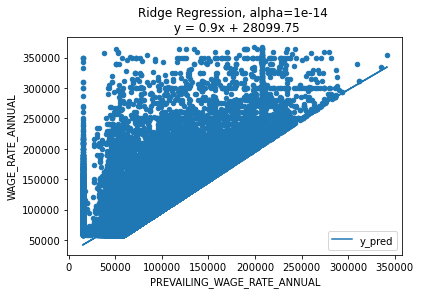

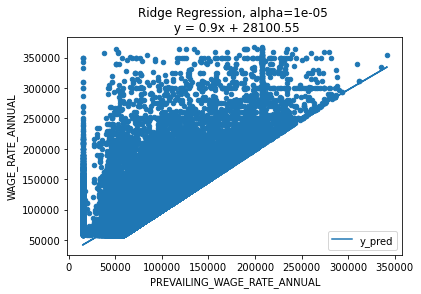

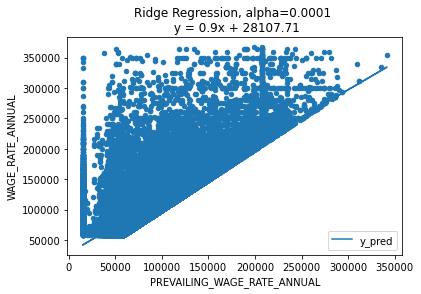

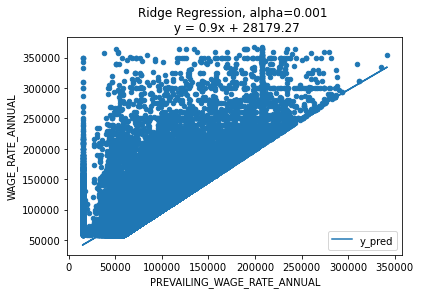

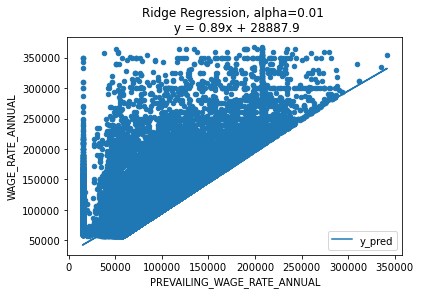

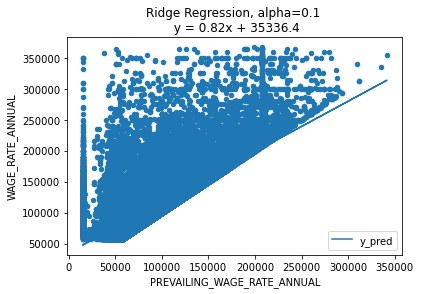

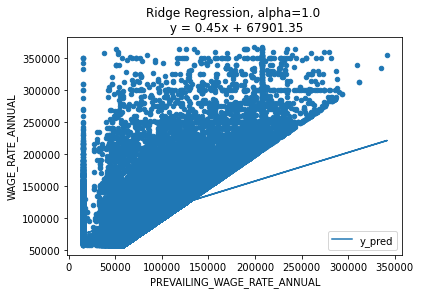

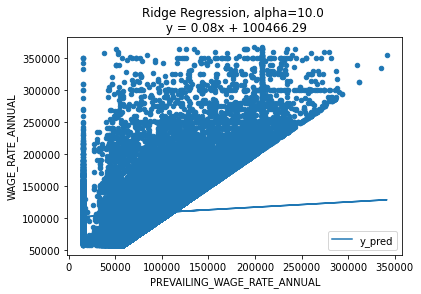

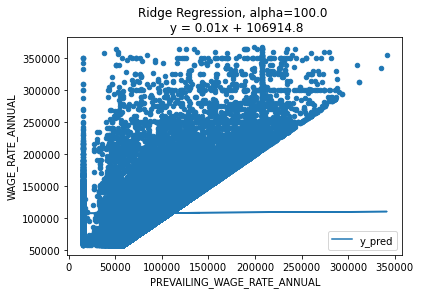

In [20]:
# Ridge Regression
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from IPython.display import display, HTML


def ridge_anscombe(alpha):
    """
    Fit & plot a ridge regression model
    alpha : positive float, regularization strength
    """

    ax = train.plot.scatter('PREVAILING_WAGE_RATE_ANNUAL', 'WAGE_RATE_ANNUAL')

    # Fit linear model
    ridge = Ridge(alpha=alpha, normalize=True)
    ridge.fit(train[['PREVAILING_WAGE_RATE_ANNUAL']], train['WAGE_RATE_ANNUAL'])

    # Get linear equation
    m = ridge.coef_[0].round(2)
    b = ridge.intercept_.round(2)
    title = f'Ridge Regression, alpha={alpha} \n y = {m}x + {b}'

    # Get predictions
    train['y_pred'] = ridge.predict(train[['PREVAILING_WAGE_RATE_ANNUAL']])
    mae = mean_absolute_error(y_train, train['y_pred'])
    display(HTML(f'Train Mean Absolute Error: ${mae:,.0f}'))
    # Plot predictions
    train.plot('PREVAILING_WAGE_RATE_ANNUAL', 'y_pred', ax=ax, title=title)
    plt.show()
    

alphas = [0.00000000000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0]
for alpha in alphas:
    ridge_anscombe(alpha=alpha)

In [21]:
# best alpha
from sklearn.linear_model import RidgeCV
ridge = RidgeCV(alphas=alphas, normalize=True)
ridge.fit(train[['PREVAILING_WAGE_RATE_ANNUAL']], train['WAGE_RATE_ANNUAL'])
ridge.alpha_

1e-05

In [22]:
train.head()

,SOC_TITLE,SOC_CODE,NAICS_CODE,EMPLOYER_NAME,AGENT_ATTORNEY_LAW_FIRM,WORKSITE_CITY_CLEAN,WORKSITE_STATE,WAGE_RATE_ANNUAL,PREVAILING_WAGE_RATE_ANNUAL,PW_WAGE_LEVEL,GPS,SOC_TITLE_MISSING,WORKSITE_STATE_MISSING,GPS_MISSING,y_pred
0,GENERAL AND OPERATIONS MANAGER,111021,444110.0,Lowe'S Companies,"Fragomen, Del Rey, Bernsen And Loewy",Mooresville,NC,191000.0,139984.0,Level III,"(35.542177, -80.8527341)",False,False,False,108157.939249
1,PHYSICAL THERAPIST,291123,621610.0,Great Lakes Home Health Services,The Murray Law,Clinton Township,MI,94578.0,94578.0,Level III,nan,False,False,True,107754.706043
2,GENERAL AND OPERATIONS MANAGER,111021,72111.0,Beltway Hotel,The Law Office Of Lan Huey Huang,Houston,TX,67745.6,67745.6,Level I,nan,False,False,True,107516.417828
3,SOFTWARE DEVELOPERS APPLICATIONS RD,151035,541511.0,Gannu Software,Nan,Shrewsbury,NJ,70000.0,69659.0,Level II,nan,False,False,True,107533.409997
4,PUBLIC RELATIONS SPECIALIST,273031,5112.0,Context Based 4 Casting,Law Offices Of Lorcan Shannon,New York,NY,75213.0,75213.0,Level III,nan,False,False,True,107582.732933


In [23]:
# one feature
import category_encoders as ce
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

lr = make_pipeline(
    ce.TargetEncoder(),  
    LinearRegression()
)

lr.fit(X_train, y_train)

Pipeline(steps=[('targetencoder', TargetEncoder(cols=[])),
                ('linearregression', LinearRegression())])

In [24]:
print('Linear Regression R^2', lr.score(X_val, y_val))

Linear Regression R^2 0.5468001738806643


In [25]:
coefficients = lr.named_steps['linearregression'].coef_
pd.Series(coefficients, features)

PREVAILING_WAGE_RATE_ANNUAL    0.896942
dtype: float64

In [26]:
train.head()

,SOC_TITLE,SOC_CODE,NAICS_CODE,EMPLOYER_NAME,AGENT_ATTORNEY_LAW_FIRM,WORKSITE_CITY_CLEAN,WORKSITE_STATE,WAGE_RATE_ANNUAL,PREVAILING_WAGE_RATE_ANNUAL,PW_WAGE_LEVEL,GPS,SOC_TITLE_MISSING,WORKSITE_STATE_MISSING,GPS_MISSING,y_pred
0,GENERAL AND OPERATIONS MANAGER,111021,444110.0,Lowe'S Companies,"Fragomen, Del Rey, Bernsen And Loewy",Mooresville,NC,191000.0,139984.0,Level III,"(35.542177, -80.8527341)",False,False,False,108157.939249
1,PHYSICAL THERAPIST,291123,621610.0,Great Lakes Home Health Services,The Murray Law,Clinton Township,MI,94578.0,94578.0,Level III,nan,False,False,True,107754.706043
2,GENERAL AND OPERATIONS MANAGER,111021,72111.0,Beltway Hotel,The Law Office Of Lan Huey Huang,Houston,TX,67745.6,67745.6,Level I,nan,False,False,True,107516.417828
3,SOFTWARE DEVELOPERS APPLICATIONS RD,151035,541511.0,Gannu Software,Nan,Shrewsbury,NJ,70000.0,69659.0,Level II,nan,False,False,True,107533.409997
4,PUBLIC RELATIONS SPECIALIST,273031,5112.0,Context Based 4 Casting,Law Offices Of Lorcan Shannon,New York,NY,75213.0,75213.0,Level III,nan,False,False,True,107582.732933


In [27]:
train.shape, val.shape, test.shape # ((73697, 14), (18425, 14), (23031, 14))

((73697, 15), (18425, 14), (23031, 14))

In [28]:
train= train.drop(columns=['y_pred'])

In [29]:
train.shape, val.shape, test.shape

((73697, 14), (18425, 14), (23031, 14))

In [30]:
target = 'WAGE_RATE_ANNUAL'
features = ['PREVAILING_WAGE_RATE_ANNUAL','SOC_CODE','NAICS_CODE']

X_train = train[features]
y_train = train[target]

X_val = val[features]
y_val = val[target]

X_test = test[features]
y_test = test[target]

In [32]:
# 3 featurescoefficients = lr.named_steps['linearregression'].coef_
# pd.Series(coefficients, features)
import category_encoders as ce
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

lr = make_pipeline(
    ce.TargetEncoder(),  
    LinearRegression()
)

lr.fit(X_train, y_train)

Pipeline(steps=[('targetencoder', TargetEncoder(cols=[])),
                ('linearregression', LinearRegression())])

In [35]:
print('Linear Regression R^2', lr.score(X_val, y_val))

Linear Regression R^2 0.557938175517027


In [36]:
coefficients = lr.named_steps['linearregression'].coef_
pd.Series(coefficients, features)

PREVAILING_WAGE_RATE_ANNUAL    0.903363
SOC_CODE                       0.072514
NAICS_CODE                     0.009157
dtype: float64

In [37]:
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

gb = make_pipeline(
    ce.OrdinalEncoder(), 
    XGBRegressor(n_estimators=200, objective='reg:squarederror', n_jobs=-1)
)

gb.fit(X_train, y_train)
y_pred = gb.predict(X_val)
print('Gradient Boosting R^2', r2_score(y_val, y_pred))

Gradient Boosting R^2 0.7833524067335377


In [38]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 72

In [39]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'PREVAILING_WAGE_RATE_ANNUAL'

isolated = pdp_isolate(
    model=gb, 
    dataset=X_val, 
    model_features=X_val.columns, 
    feature=feature,
    num_grid_points=50
)

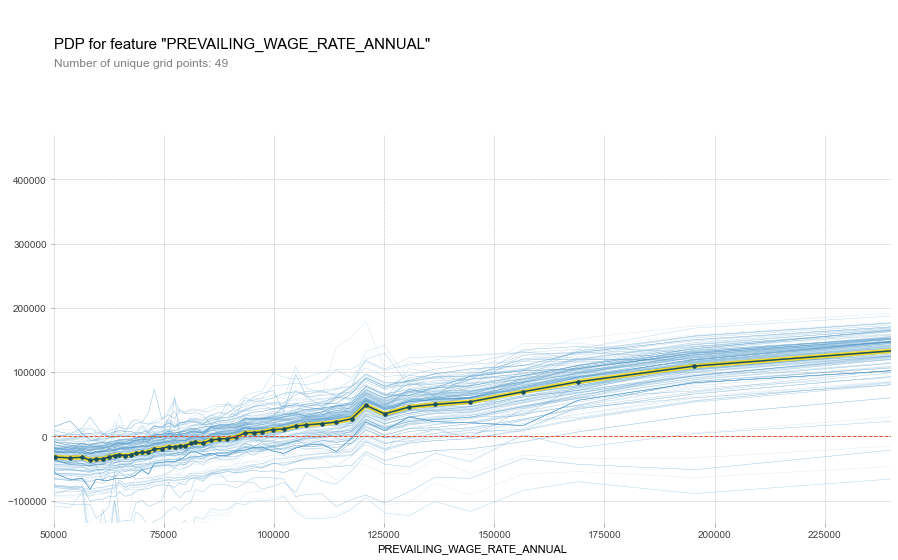

In [40]:
pdp_plot(isolated, feature_name=feature, plot_lines=True, 
         frac_to_plot=0.01)
plt.xlim(50000,240000);

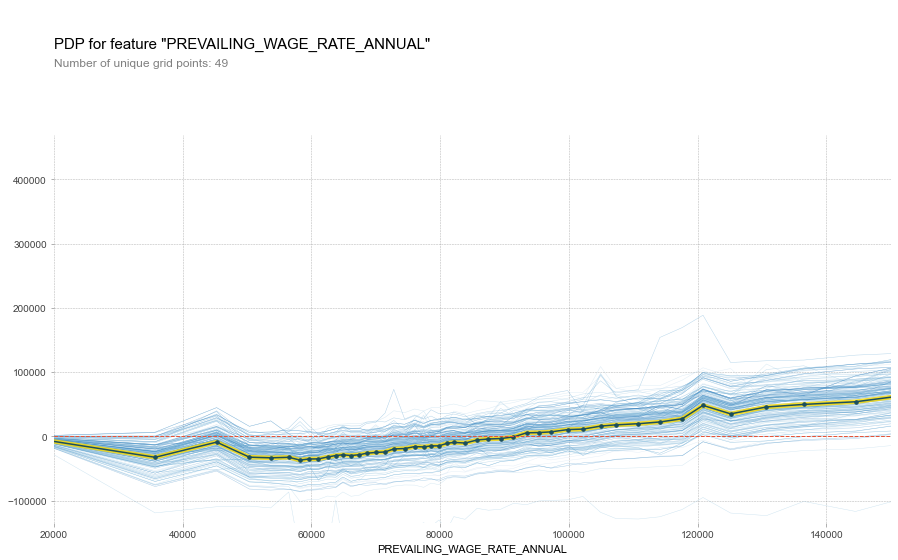

In [41]:
# Plot PDP with ICE curves
# PDP: Partial Dependence Plot
# ICE: Individual Conditional Expectation
pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=0.01)

plt.xlim(20000,150000);

In [42]:
# 2features
from pdpbox.pdp import pdp_interact, pdp_interact_plot
features = ['PREVAILING_WAGE_RATE_ANNUAL','SOC_CODE']

interaction = pdp_interact(
    model=gb, 
    dataset=X_val, 
    model_features=X_val.columns,
    features=features
)

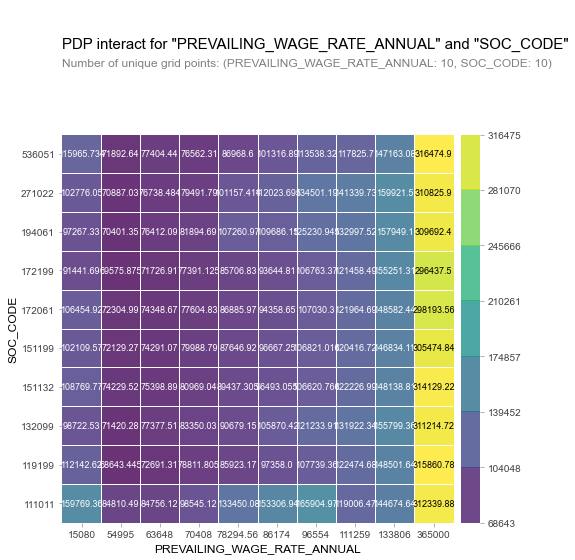

In [43]:
pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

In [44]:
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

param_distributions = { 
    'n_estimators': randint(50, 500), 
    'max_depth': [5, 10, 15, 20, None], 
    'max_features': uniform(0, 1), 
}

search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42), 
    param_distributions=param_distributions, 
    n_iter=5, 
    cv=2, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1, 
    random_state=42
)

search.fit(X_train, y_train);

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:   18.0s remaining:   42.0s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:   19.4s remaining:   19.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:   20.5s remaining:    8.8s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   25.4s finished


In [45]:
print('Best hyperparameters', search.best_params_)
print('Cross-validation MAE', -search.best_score_)
model = search.best_estimator_

Best hyperparameters {'max_depth': None, 'max_features': 0.6011150117432088, 'n_estimators': 201}
Cross-validation MAE 13156.978493767725


In [46]:
row = X_test.iloc[[0]] # Dataframe with a single row (double brackets keeps it a dataframe)
row

,PREVAILING_WAGE_RATE_ANNUAL,SOC_CODE,NAICS_CODE
0,91416.0,172071,33911.0


In [47]:
y_test.iloc[[0]]

0    91416.0
Name: WAGE_RATE_ANNUAL, dtype: float64

In [48]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(row)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values, 
    features=row
)

In [49]:
# Base value is approximately equal to the mean baseline
explainer.expected_value, y_train.mean()

(array([107690.60674635]), 107702.94569216935)

In [50]:
# Let's look at the Shapley values for each feature ...
# How much each added or subtracted to the prediction

feature_names = row.columns
feature_values = row.values[0]
shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))
shaps

(PREVAILING_WAGE_RATE_ANNUAL, 91416.0)    -449.134125
(SOC_CODE, 172071.0)                     -3028.081133
(NAICS_CODE, 33911.0)                      235.770701
dtype: float64

In [51]:
# Add them up ...
shaps.sum()

-3241.4445572962723

In [52]:
# ... and you get the predicted value
explainer.expected_value + shaps.sum() 

array([104449.16218906])